#DSML Advanced : KNN


## Content

### kNN

- Blinkit Problem Statement

- Motivation for kNN
  - Will Logistic Regression work for multi-Class?
  - What can be an issue with One vs Rest method ?
  - Now what if there is non-linearity in the data , will a simple Logistic Regression work ?
  - But how can we visualize our 7-dimensional data to check non-linearity ?

- Geometric Intuition

- The KNN Algorithm
 - How does kNN perform multi-classification without using One-vs-Rest approach ?
 - How kNN handles non-linearity in the data ?

- Scratch Implementation of kNN

- Sklearn's KNN implementation
 - What does the meshgrid function help in visualization of decision boundary ?
 - But why use  x_min, x_max, y_min and y_max of test data for meshgrid creation ?
 - Why are there some datapoints misclassifed ?

- Issue with Euclidean

- Different Distance Metrics
    - Why is the kNN model still misclassifying when Euclidean distance is not the issue ?

- Weighted KNN
 - What if we take K as even number, such that we have 2 +ve class labels and 2 -ve class labels as top 4 neighbors?
 - What if we take K=5, and we have all the +ve and -ve class labels datapoints  equidistant from $x_q$, then how KNN predicts class label for $x_q$ ?


- Assumption of KNN

-  Train and Test Time-Complexity
 - What will be the time complexity to run KNN on one test point $x_q$ ?
 - which sorting algorithms can we use which has minimum time complexity ?
 - What about the train complexity for KNN ?

- Bias-Variance Trade Off in KNN
 - how do we control the bias-Variance trade-off ?


- Outliers
 - What if $x_q$ is an outlier, will KNN model be impacted ?
 - How do we determine, whether $x_q$ is outlier or not ?

- Interpretation of kNN Model
 - how to make a doctor (non DS expert) understand the working of KNN ?
 - What if most features in $x_q$ are categorical, how will be calculating distance ?
 - What are the different Distance metrics and when to use which ?
 - Can we have a probalistic class label for KNN ?


 -  Google Image Search


-  kNN based imputation
 - Can we use KNN for Imputating missing data ?



# Problem statement

**Blinkit** is expanding its store, and wants optimal number of delivery partners per store

- For this, the company has classified the existing stores into 3 classes based on the product purchase:
  1. Class1 : High traffic
  2. Class2 : Moderate traffic
  3. Class3 : Low traffic

<br>

The company wants you to classify the new stores into these classes







In [ ]:
import pandas as pd
import numpy as np

In [ ]:
!gdown 1ZdhRqYv-JizWV6DxO6C4R_k1kxPhmlF2
#https://drive.google.com/file/d/1ZdhRqYv-JizWV6DxO6C4R_k1kxPhmlF2/view?usp=sharing

Downloading...
From: https://drive.google.com/uc?id=1ZdhRqYv-JizWV6DxO6C4R_k1kxPhmlF2
To: /content/multiclass.csv
100% 14.6k/14.6k [00:00<00:00, 18.0MB/s]


In [ ]:
df=pd.read_csv('multiclass.csv')
df.head()

,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,class
0,3,12669,9656,7561,214,2674,1338,2
1,3,7057,9810,9568,1762,3293,1776,2
2,3,6353,8808,7684,2405,3516,7844,2
3,3,13265,1196,4221,6404,507,1788,1
4,3,22615,5410,7198,3915,1777,5185,1


**Data Description**

|feature|Description|
|-|-|
|**Region**|where the store is located (1: Tier-1 city, 2: Tier-2 city, 3:Tier-3 city)|
|**Fresh**|purchase history of Fresh food|
|**Milk**|purchase history of milk product|
|**Grocery**|purchase history of Grocery|
|**Frozen**|purchase history of Frozen food|
|**Detergents_Paper**|purchase history of washing products|
|**Delicassen**|purchase history of imported products, cooked meat|
|**class**|Store catgeory based on demand on products|





Now lets see the count of sample each of the three classes

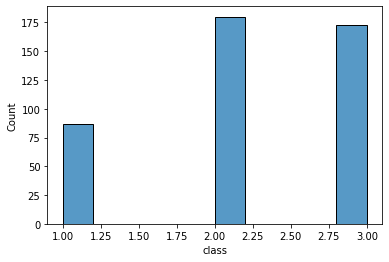

In [ ]:
import seaborn as sns
sns.histplot(data=df, x="class")

Lets now define our X and y for the model

In [ ]:
X=df[['Region',	'Fresh',	'Milk',	'Grocery',	'Frozen',	'Detergents_Paper',	'Delicassen'	]].copy()
y=df[['class']].copy()

# **Motivation for kNN**

#### Will Logistic Regression work for multi-Class?
Ans: It can, but we will have to use
- One vs Rest method to make the logistic Regression do predictions on this data.

#### Question: What can be an issue with One vs Rest method ?
Ans: In real world problems, we can have K number of classes
- and building K different logisitic Regression model is Computationally expensive task

#### Now what if there is non-linearity in the data , will a simple Logistic Regression work  ?

Ans: No



<br>




#### But how can we visualize our 7-dimensional data to check non-linearity ?
Ans: We use the Principal Component Analysis (PCA)
- to reduce the 7 features of the datapoints to just 2



In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# reducing features to just 2 features
pca = PCA(n_components=2)
X = pca.fit_transform(X)
X.shape

(440, 2)

Visualizing the datapoints

[0.45961362 0.40517227]


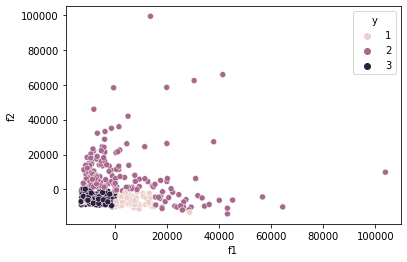

In [ ]:
df2 = pd.DataFrame(X, columns=['f1', 'f2'])
df2['y'] = y
print(pca.explained_variance_ratio_)
sns.scatterplot(data= df2, x= 'f1',y = 'f2' , hue = 'y')
plt.show()

**Observe**

the data contains non-linearity

#### Can we not use polynomial features for Logistic Regression ?
Ans: Yes we can, but again, adding the correct Polynomial features
- requries extensive research for which degree of feature to be used
- And also makes the model computationally expensive

<br>

Now that we know there is non-linearity and Multi-Class in our problem statement
- we introduce a new algorithm **KNN or K- Nearest Neighbor**
- a simplier and much easier algorithm to perform accurate Multi-Class Classification
- Even when there is non-linearity in the data

# **Geometric Intuition of kNN**

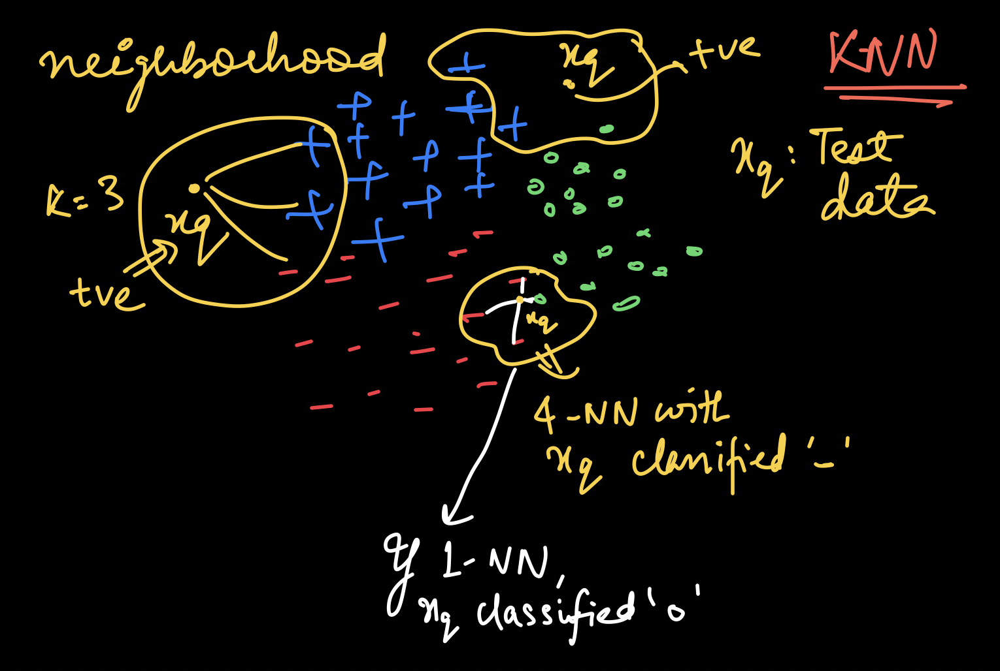


Lets understand KNN algorithm geometrically with a simple example:

 Lets assume we have a three class datapoints in our Training data:
 - -ve class data points
 - +ve class data points
 - 'o' class data points  


Now in our test data, we have a query point $x_q$

#### What will be the class label for $x_q$ at the top-right of the plot?
- From the plot, its  Most likely to be +ve class data point
- Since all the surrounding points are +ve with only one 'o' class datapoint

Now if we had a $x_q$ in the near the left side of the plot,
#### what will the class label for $x_q$ be ?
- +ve since the surrounding points are mostly +ve



**This shows that KNN is a neighborhood Algorithm, since it checks the neighborhood of $x_q$ and then assigns class label to the data point.**

#### But if now our $x_q$ is at point such that there are 3 -ve class data points and one class 'o' data point, what will the class label for $x_q$ for such case be ?
Since we are considering 4 points around $ x_q $ , we can say
 - $x_q$ belongs to -ve class since majority of neighbor points are -ve class labels

- but if we consider only 1 point around $x_q$, we can say
 - $x_q$ belongs to 'o' class since the distance between the 'o' class data point and $x_q$ is minimum

Hence this means that the number of points we consider as our neighborhood thus impacts the KNN.
- Therefore the K in the KNN means the number of  points we are to consider as our neighborhood.

















Lets write the pseudo code for KNN algorithm when we have a data point $x_q$ in test data,


# **The KNN Algorithm**
1. for each $x_i$ in training data
    - Compute distance between $x_i$ and $x_q$
    - And store it in a distance vector $D$
2. Sort the distance vector $D$
3. Then pick the K Nearest Neighbors, or the points which have the least distance from $x_q$
4. Take majority vote of class label from all the K points and return the class label which has the max vote for $x_q$

In simple words,
- if we take K = 5, and after sorting the distance vector
- we get 3 +ve class label data points and 2 -ve Class label data  
- then through majority voting, $x_q$ will belong to +ve class.

#### What will be the distance vector ?
for computing the distance between $x_i$ and $x_q$
- we will be using Euclidean distance.




    

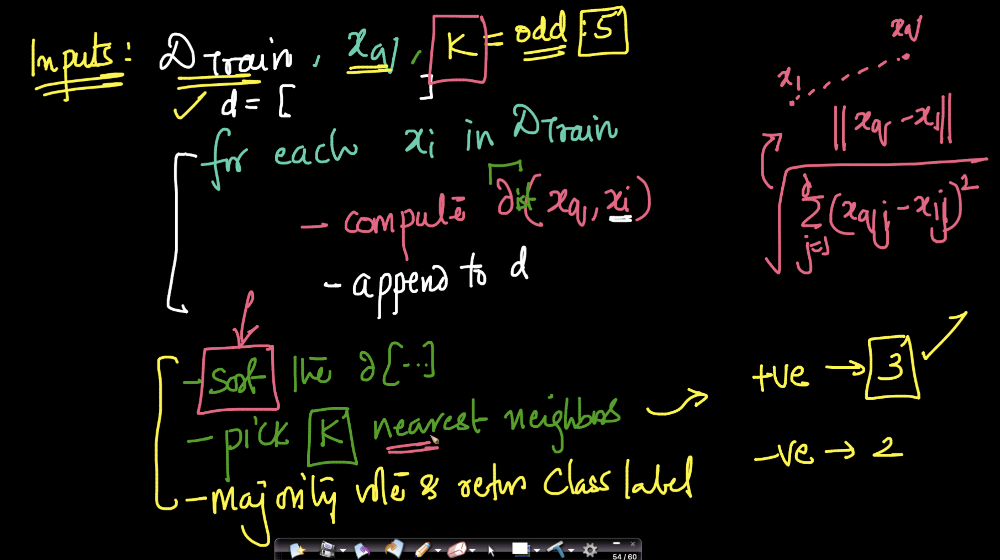

# Scratch Implementation of kNN

lets split the data into train, validation and test set

In [ ]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

X_train_val, X_test, y_train_val, y_test = train_test_split(X,\
                                                    y.values[:,0],\
                                                    test_size=0.25, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_train_val,\
                                                    y_train_val,\
                                                    test_size=0.25, random_state=42)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(247, 2) (247,)
(83, 2) (83,)
(110, 2) (110,)


Standardization of data

In [ ]:
mu = X_train.mean(axis=0)
sig = X_train.std(axis=0)

In [ ]:
X_train = (X_train-mu)/sig
X_val = (X_val-mu)/sig
X_test = (X_test-mu)/sig

kNN Implementation from Scratch

In [ ]:
def knn(X,Y,queryPoint,k=5):
    """Predict the class label for the query point"""
    # Euclidean Distance
    dist = np.sqrt(np.sum((queryPoint-X)**2,axis=1) )

    # Storing distance and Class labels together
    distances = [(dist[i],Y[i]) for i in range(len(dist)) ]
    # sort the distances
    distances = sorted(distances)
    # Nearest/First K points
    distances = distances[:k]

    print(f'k nearest neighbors with the distance and class label :{distances}')
    distances = np.array(distances)

    classes_counts = np.unique(distances[:,1],return_counts=True)
    #print(classes_counts)

    index = classes_counts[1].argmax()
    pred = classes_counts[0][index]

    return int(pred)

taking the 50th test data as our $x_q$

In [ ]:
X_test[50]

array([0.12263833, 1.24645031])

Predicted class label for $x_q$

In [ ]:
print(f'The predicted class label: {knn(X_train, y_train, X_test[50]) }')

k nearest neighbors with the distance and class label :[(0.18070886525751703, 2), (0.3267729243339275, 2), (0.3939690441373117, 2), (0.413636334408564, 2), (0.5303829069102112, 2)]
The predicted class label: 2


**Notice**
We see all the 5 datapoints which are closest to the $x_q$ have:
- The same class labels = 2

Hence the final prediction for the class label for the test data is 2

Lets see what is the actual class label for $x_q$

In [ ]:
y_test[50]

2

**Observe**

that our model performed predicted the labels correctly

- Now lets see the accuracy of our KNN on test data

In [ ]:

# Test Time
def knn(X,Y,queryPoint,k=5):
    """Predict the class label for the query point"""
    # Euclidean Distance
    dist = np.sqrt(np.sum((queryPoint-X)**2,axis=1) )

    # Storing distance and Class labels together
    distances = [(dist[i],Y[i]) for i in range(len(dist)) ]
    # sort the distances
    distances = sorted(distances)
    # Nearest/First K points
    distances = distances[:k]

    distances = np.array(distances)

    classes_counts = np.unique(distances[:,1],return_counts=True)

    index = classes_counts[1].argmax()
    pred = classes_counts[0][index]

    return int(pred)

In [ ]:
y_pred = np.zeros(X_test.shape[0])

for i in range(X_test.shape[0]):
    y_pred[i] = knn(X_train, y_train, X_test[i])

print(f'Accuracy :{round(100*(y_pred == y_test).sum()/y_pred.shape[0], 2)}')

Accuracy :95.45


**observe**

With such a high accuracy, the kNN model shows:
- How well it fits for non linear data as well

<br>

```
Hence kNN is prefered over logistic Regression for both:
- Multi Class problem
- And when data is non linear
```

# **How kNN handles Multi-Classification**

#### How does kNN perform multi-classification without using One-vs-Rest approach ?

Since our dataset has three class labels,

- and have $K_{best} = 5$
- Now if we have three test data, we will do the same steps
 - of finding distance for each of the datapoints from these three test datapoints
 - Then perform a majority vote
 - and select the majority class label for the test datapoint.

For Example:
```
if k = 5, and there are 9 datapoints such that:
x1 = [1,2] belongs to Class A
x2 = [3,4] belongs to Class A
x3 = [4,2] belongs to Class A
x4 = [13,13] belongs to Class B
x5 = [10,14] belongs to Class B
x6 = [12,15] belongs to Class B
x7 = [5,5] belongs to Class C
x8 = [6,3] belongs to Class C
x9 = [7,3] belongs to Class C
```

Now if we have a query points of $x_{q1} = [2,4]$, $x_{q2} = [14,15]$, $x_{q3} = [7,5]$

#### Which class will the query points belong to ?
Ans:  With the majority vote in mind, it pretty clear
- [x1,x2,x3,x7] are nearest neighbors for $x_{q1}$, with majority belonging to class A hence  $x_{q1}$ belong to Class A
- Similarly, $x_{q2}$ will belong to Class B
- And, $x_{q3}$ will belong to Class C

Showing how kNN does not need One vs Rest approach for multi-class setting








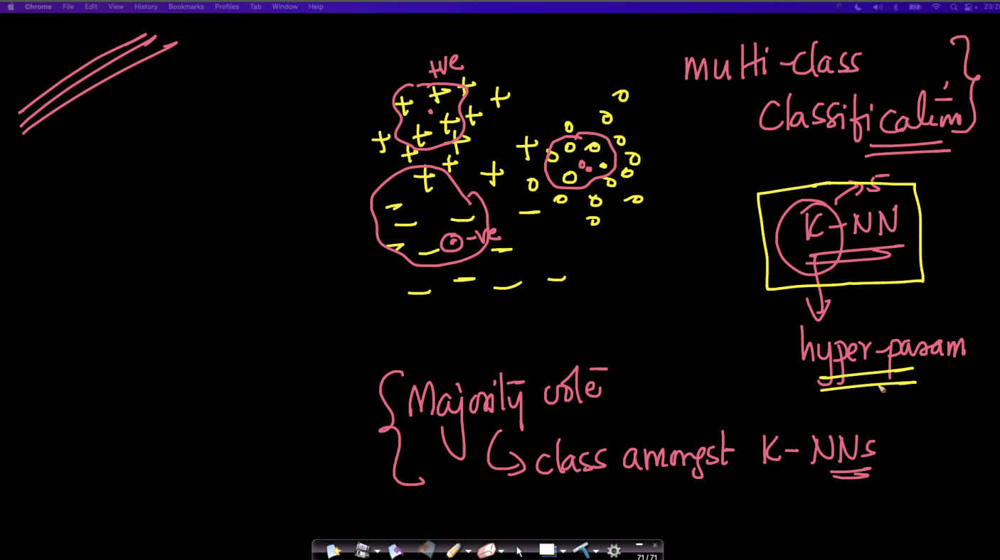

#### **Question: How kNN handles non-linearity in the data ?**

Lets Understand the Non-linearity part through an example:

- If our data looks like 3 concentric circles, where the 2nd Circle has all +ve class labels and 3rd Circle has all -ve class labels

    - Now if we take our K = 3,
        - and have $x_q$ in the 3rd circle, we will have a correct prediction of -ve label

        - now if $x_q$ is in the 2nd circle, we will have a correct prediction of +ve label

Showing that, kNN is able to correctly classify even if there is non-linearity in the data.
<br>

#### What will happen for the point $x_q$ which are in between 2nd Circle and 3rd Circle ?
ANS: There can be cases where $x_q$ can be mis-classified.


With all of this we can conclude that:

- Manupilating with K value to find the $k_{best}$ of KNN when classifying test datapoints.

- Density of data: how closely the datapoints are to each other. Since KNN is after all a neighborhood algorithm, so homogeneity maintains for more dense data.


- And the gap between the classes helps in better separating datapoints according to class labels.















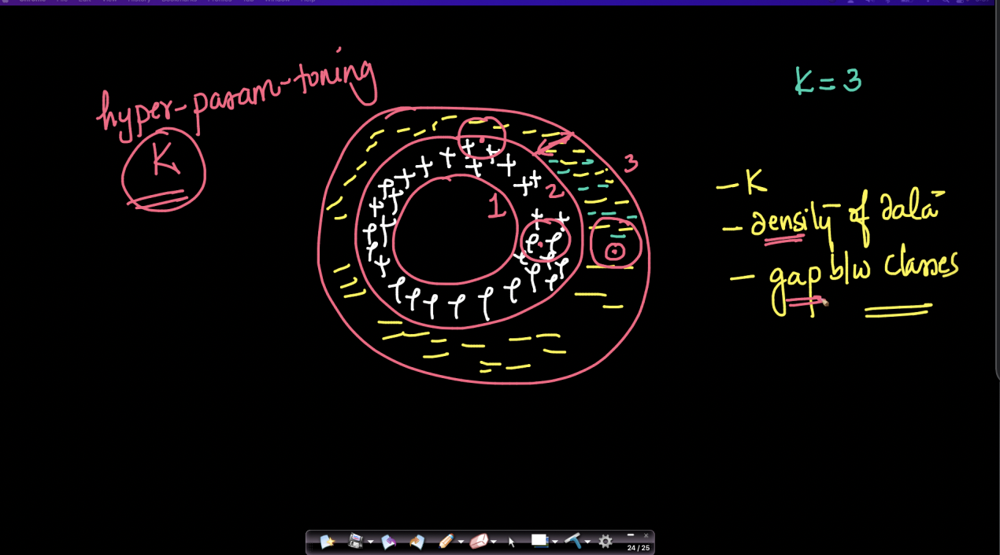

# Sklearn's [KNN](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html) implementation

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt

Fit method stores the training datapoints in the kNN model

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5,metric='euclidean')

knn.fit(X_train, y_train)


KNeighborsClassifier(metric='euclidean')

Accuracy of KNN on Test data

In [ ]:
y_pred = knn.predict(X_test)
knn.score(X_test, y_test)

0.9545454545454546

Precision, Recall, F1-Score of KNN on test data

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix,plot_confusion_matrix


print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.90      0.90      0.90        20
           2       0.98      0.94      0.96        47
           3       0.96      1.00      0.98        43

    accuracy                           0.95       110
   macro avg       0.94      0.95      0.94       110
weighted avg       0.95      0.95      0.95       110



**Observe**

That the kNN model is most accurate in predicting the resellers that belong to class 3
- and the least accurate with f1-score of 90% (which is still good) when predicting the resellers that belong to class 1

This is due to the less data samples present in the class-1.
- This issue will be <font color='red'> handled in the upcoming lecture for Imbalance data lecture</font>

Confusion Matrix of KNN on Test Data

In [ ]:
cm = confusion_matrix(y_test, y_pred)

cm_df = pd.DataFrame(cm,index = np.unique(y_test), columns = np.unique(y_test) )

cm_df.head()

,1,2,3
1,18,1,1
2,2,44,1
3,0,0,43


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 576x576 with 0 Axes>

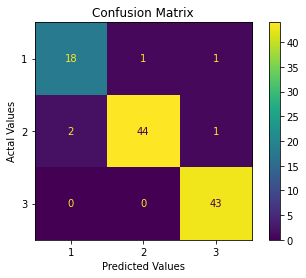

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(8,8))
plot_confusion_matrix(knn,X_test,y_test)
#sns.heatmap(cm_df, annot=True,cmap='coolwarm')
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

**Notice**

The kNN model is quite robust in its prediction for each of the classes

<br>

Lets visualize the Decision boundary of the kNN:

MeshGrid (PreRead)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets

# plt.rcParams["figure.figsize"] = [7.00, 3.50]
# plt.rcParams["figure.autolayout"] = True


h = 0.03

# defining Organe for Class-1, Cyan for Class-2 and Red for Class-3
#cmap_light = ListedColormap(['orange', 'cyan','red'])

# The color for datapoints to be highlighted with darkorange for Class-1,
# c or sky blue for class-2 and darkred for class-3
#cmap_bold = ['darkorange', 'c','darkred']


# finding the min and max of feature 1 and feature 2 for test data
x_min, x_max = X_test[:, 0].min() - 1, X_test[:, 0].max() + 1
y_min, y_max = X_test[:, 1].min() - 1, X_test[:, 1].max() + 1



# Creating a grid which ranges from the min and max value of feature 1 and feature 2 with a step of 0.3 between each datapoint
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),np.arange(y_min, y_max, h))

# Predicting the kNN on the grid data
Z = knn.predict(np.array([xx.ravel(),yy.ravel()]).T)


#### What does the meshgrid function help in visualization of decision boundary ?

Ans: The purpose of meshgrid is to create a rectangular grid out.

```
For example,

if we want to create a grid where
-  we have a point at each integer value between 0 and 4 in both the x and y axis.
-  To create a rectangular grid, we will be needing the combination of each of the x values with the y values

- This is going to be 25 points,

- So if we wanted to create an x and y array for all of these points, we could do the following.

```
Lets understand this with a quick code:



In [ ]:
y1 = [0,1,2,3,4]
y2 = [0,1,2,3,4]

grid1,grid2 = np.meshgrid(y1,y2)

In [ ]:
print(grid1)

print(" ")

print(grid2)

[[0 1 2 3 4]
 [0 1 2 3 4]
 [0 1 2 3 4]
 [0 1 2 3 4]
 [0 1 2 3 4]]
 
[[0 0 0 0 0]
 [1 1 1 1 1]
 [2 2 2 2 2]
 [3 3 3 3 3]
 [4 4 4 4 4]]


**Observe**

grid1 contains all the possible values y1 can take
- when y2 = 0,1,2,3,4

While grid2 contains all the possible values y2 can take
- when y1 = 0,1,2,3,4

<br>

Lets plot these to verify that they are a grid:

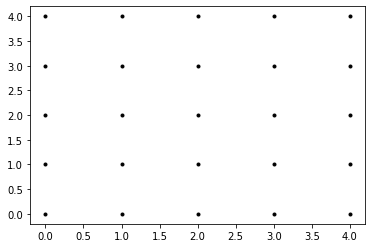

In [ ]:
plt.plot(grid1,grid2, marker='.', color='k', linestyle='none')



#### But why use  x_min, x_max, y_min and y_max of test data for meshgrid creation ?
Ans: We want the grid
- Which has all the datapoints which includes the feature1 and feature2 of the X_test data
- and also some datapoints which are around the these features



#### With this, lets now plot the decision boundary

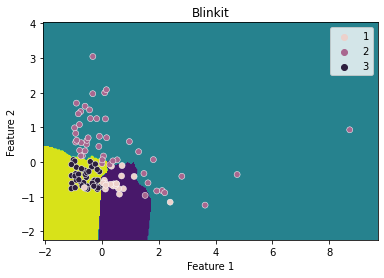

In [ ]:
# Reshaping predictions for contour visualization purpose
Z = Z.reshape(xx.shape)

plt.figure()

# plotting the decision boundary of kNN model
#plt.contourf(xx, yy, Z, cmap=cmap_light)
plt.contourf(xx, yy, Z)
# plotting the test datapoints for each class

#sns.scatterplot(x=X_test[:, 0], y=X_test[:, 1], hue = y_test,
#palette=cmap_bold, alpha=1.0, edgecolor="black")

sns.scatterplot(x=X_test[:, 0], y=X_test[:, 1], hue = y_test)

plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())

plt.title('Blinkit')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

plt.show()


**Observe**

How the kNN creates a much accurate decision boundary
-  to separate the data into three categories.

#### Why are there some datapoints misclassifed ?
Ans: Might be wrongly placed datapoints in each class
- or the Euclidean distance might not be right choice for such a data

### **Problem with Euclidean Distance**


- The most basic distance measure can be done using **Euclidean Distance**
- Which is the sum of the sqaure difference between each of the d-dimensional point of $x_1$ with $x_2$ and take a square root of it.
    - Euclidean $(x_1,x_2) = [ ∑_{j=1}^{j=d} {{ (x _{1j} - x _{2j} )}^2] }^{\frac{1}{2}} $


#### But what if value of d becomes too high ?
- Thats where Euclidean Distance fails to work due to something known as Curse of Dimensionality whose maths <font color='red'>we will cover in later lectures.<font>



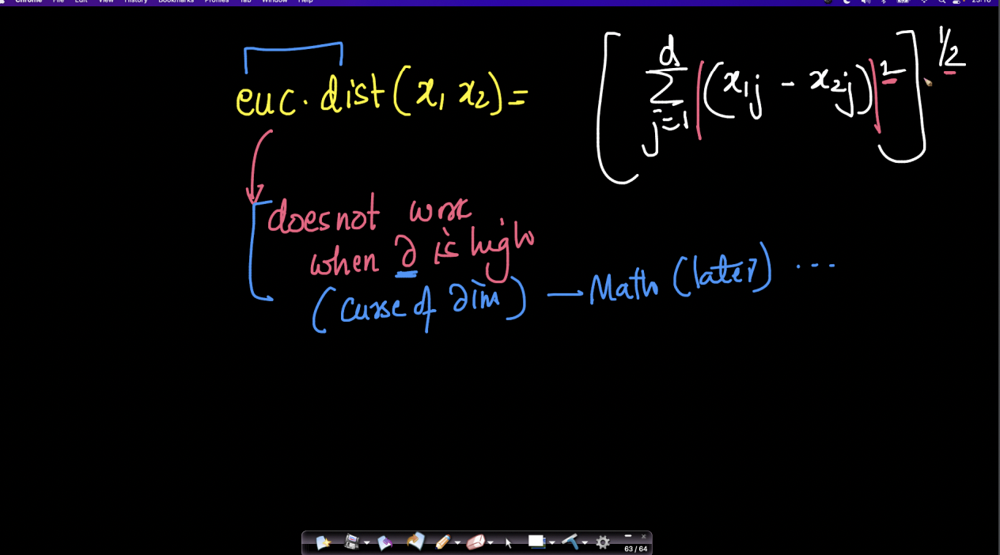

### **Different Distance Metrics**

We now look into another distance measure metrics:  Manhattan Distance which is sum of all the absolute difference between each of the d-dimensional point of $x_1$ with $x_2$
- Manhattan $(x_1,x_2) = ∑_{j=1}^{j=d} {[{ | x _{1j} - x _{2j} |)}^1] }^{1} $

Now lets understand Manhattan, geometrically:

- We know between two feature points $x_1,x_2$, Euclidean distance will be the hypothesis of the right angle triangle

#### **What will be the Manhattan Distance ?**
- We are adding distance ($d_1$) along one axis (Here feature $f_1$ )
- and then the distance ($d_2$)along the other axis (Here feature $f_2$)
- Now summing up both $d_1$ and $d_2$ gives our Manhattan Distance

Lets understand it more with a grid like example:
- if we want to move from bottom-left point to top-right point,
- We can only move parallel to the axes (is that only up,down, left,right)
- And the closest path through which we can reach the goal point is our Manhattan Distance.

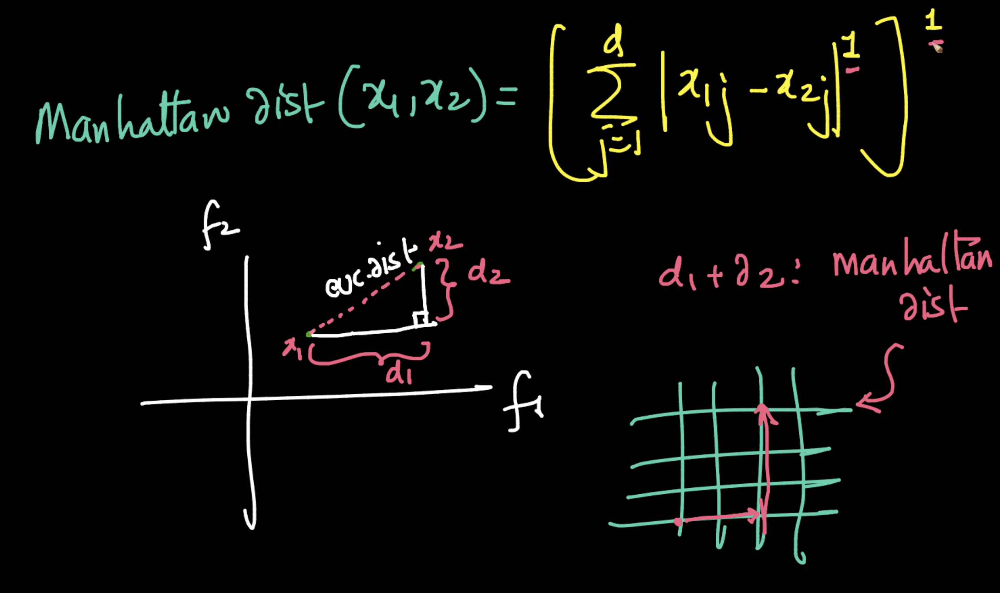

- If we add Absolute to Euclidean Distance,
    - Since if we remember, $|x|^2$ is same as $x^2$ because:
        - $(-x)^2 = (x)^2 = x^2$
        - and $|x| = ^{+}_{-}x$   
- we notice how Euclidean and Manhattan are very similar and the only difference is in the powers
    - Euc$(x_1,x_2) = ∑_{j=1}^{j=d} {[{ | x _{1j} - x _{2j} |}^2] }^{\frac{1}{2}} $

    - Man$(x_1,x_2) = ∑_{j=1}^{j=d} {[{ | x _{1j} - x _{2j} |}^1] }^{1} $


Hence we generalize these distances using Minkowski Distance which has a power of P and $\frac{1}{p}$

- Minkowski$(x_1,x_2) = ∑_{j=1}^{j=d} {[{ | x _{1j} - x _{2j} |}^p] }^{\frac{1}{p}} $

- if p = 1, we get Manhattan Distance
- if p = 2, we get Euclidean Distance

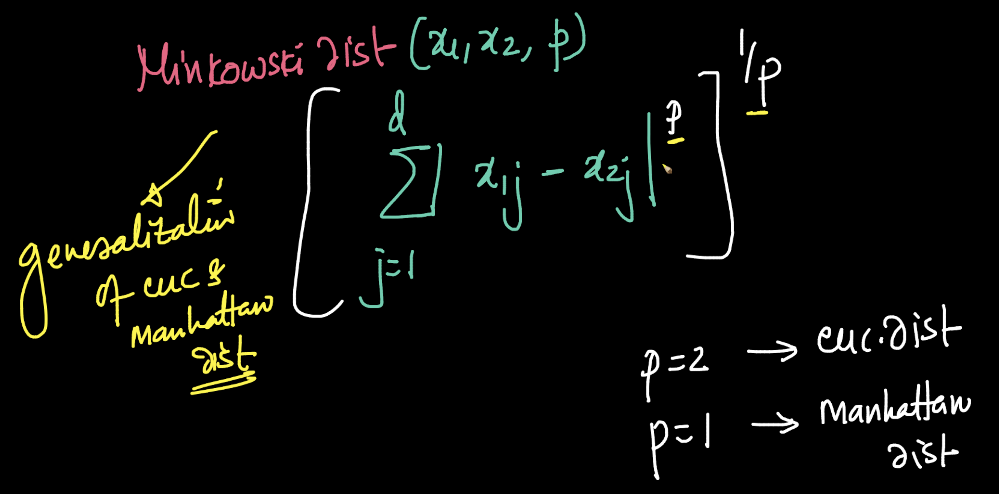


#### Why are there some datapoints misclassifed ?
Ans: Even after the modification, the model cannot classify these datapoints,
 maybe the k of the model is not optimal

<br>

Lets do a hyperparameter tuning on k
- to find the optimal or the best value of k between: $1 \le k \le 50$



In [ ]:
error = []

# Calculating error for K values between 1 and 50
# Note: 51 is not included in the loop
for i in range(1, 51):
    knn = KNeighborsClassifier(n_neighbors=i,metric='euclidean')
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_val)

    # Note: Error defined as 1-accuracy
    error.append(np.mean(pred_i != y_val))

Visualizing the error and K values

Text(0, 0.5, 'Mean Error')

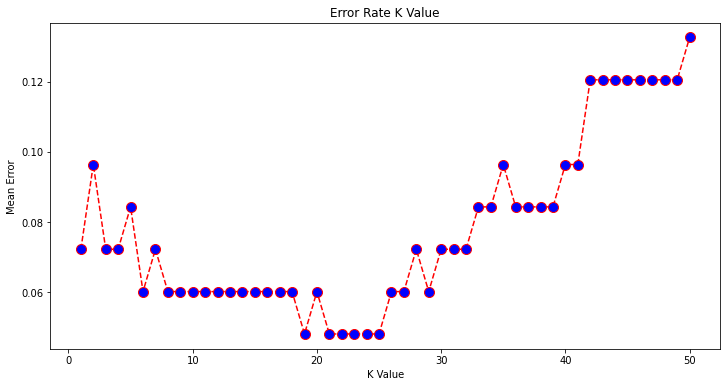

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(range(1, 51), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

- Noticing that the first K value where Mean error is lowest is at K = 19,
- Hence $K_{best} = 19$

Note: The finding of $K_{best}$ was done on Validation Data

In [ ]:
knn = KNeighborsClassifier(n_neighbors=19,metric='euclidean')

knn.fit(X_train, y_train)


KNeighborsClassifier(metric='euclidean', n_neighbors=19)

Accuracy of KNN on Test data

In [ ]:
y_pred = knn.predict(X_test)
knn.score(X_test, y_test)

0.9

Precision, Recall, F1-Score of KNN on test data

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix,plot_confusion_matrix

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.75      0.90      0.82        20
           2       0.97      0.81      0.88        47
           3       0.91      1.00      0.96        43

    accuracy                           0.90       110
   macro avg       0.88      0.90      0.89       110
weighted avg       0.91      0.90      0.90       110



Confusion Matrix of KNN on Test Data

In [ ]:
cm = confusion_matrix(y_test, y_pred)

cm_df = pd.DataFrame(cm,index = np.unique(y_test), columns = np.unique(y_test) )

cm_df.head()

,1,2,3
1,18,1,1
2,6,38,3
3,0,0,43


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 576x576 with 0 Axes>

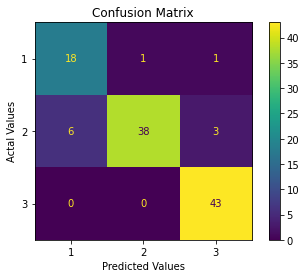

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(8,8))
plot_confusion_matrix(knn,X_test,y_test)
#sns.heatmap(cm_df, annot=True,cmap='coolwarm')
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

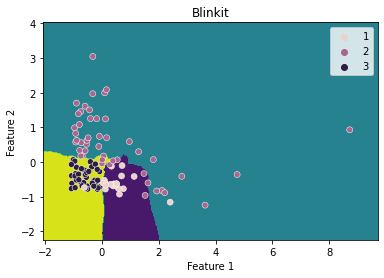

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets

# prediction of weighted knn on grid data
Z = knn.predict(np.array([xx.ravel(),yy.ravel()]).T)

# Reshaping predictions for contour visualization purpose
Z = Z.reshape(xx.shape)

plt.figure()

# plotting the decision boundary of kNN model
plt.contourf(xx, yy, Z)

# plotting the test datapoints for each class

sns.scatterplot(x=X_test[:, 0], y=X_test[:, 1], hue = y_test)

plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())

plt.title('Blinkit')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

plt.show()



**observe**

While doing the hyperparameter tuning,
- there are a few more datapoints which are misclassified
- Hence these datapoints are just noise in the data itself


## **Assumption of KNN:**

Now as we saw, how kNN model performance so well in both Non-linear data and Multi-class data,
- which are not resolved by the Logistic Regression mainly due to some of its assumption like a linearly separable hyperplane should exist  

<br>

Similarly, The KNN algorithm assumes that
- similar datapoints exists in close neighborhood.
- In other words, Neighborhoods are homogeneous is that, similar things are near to each other




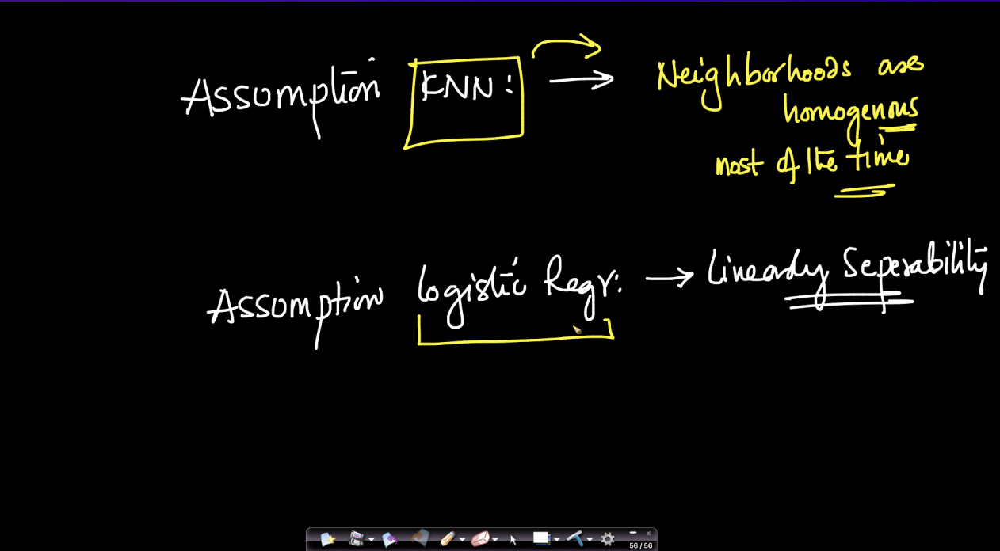

## **Time-Complexity of KNN**




- we all have learnt searching and sorting algorithms, but fail to understand where to use them.
- if we look closely, KNN uses sorting algorithms so to quickly have a sorted distanc vector $d$.



Supposedly we have n samples (datapoints) and each datapoint is d-dimensional


#### **What will be the time complexity to run KNN on one test point $x_q$ ?**

1. we find distance of all datapoints {$x_1,x_2,..x_i,..,x_n$} with respect to  $x_q$
    - the time complexity will be : $O(n.d)$

2. we then sort the distance vector $D$

<br>

#### **which sorting algorithms can we use which has minimum time complexity ?**
- Merge Sort, time complexity being $O(nlogn)$

3. Now we select K-top points on the distance vector and the time complexity becomes $O(K)$

<br>

So our overall test-Time-Complexity for KNN becomes $O(nd+nlogn+K)$

- since K is a very small value as compared to n and d,  we can neglect it
- Now our Complexity becomes $O(n(d+logn) )$

<br>

Now lets understand what will be the Space-complexity for KNN
- n samples (datapoints) and each datapoint is d-dimensional and we select top K points
- So Space-Complexity becomes : $O(n.d + K.d)$
- but K is very small, hence we neglect K.d
-  Now the Space-Complexity becomes $O(n.d)$

We have been talking about,
- How can we calculate distance between $x_q$ and the other datapoints $x_i$

<br>

This is a BRUTE-FORCE Algorithms, And we can see how much of a memory and time this Brute-Force KNN algorithm requires.
- this becomes a major disadvantage for KNN

- But there are State of Art models (SOTA) which are bleeding edge KNN algorithms
    - [Google ScaNN: Efficient Vector Similarity Search](https://ai.googleblog.com/2020/07/announcing-scann-efficient-vector.html)
    - [Facebook Faiss](https://engineering.fb.com/2017/03/29/data-infrastructure/faiss-a-library-for-efficient-similarity-search/)

<br>

#### **What about the train complexity for KNN ?**
- If you noticed, we do not train KNN models.
- we just have some Training data on which we put our test data $x_q$.
- So the time complexity for training data becomes $O(1)$



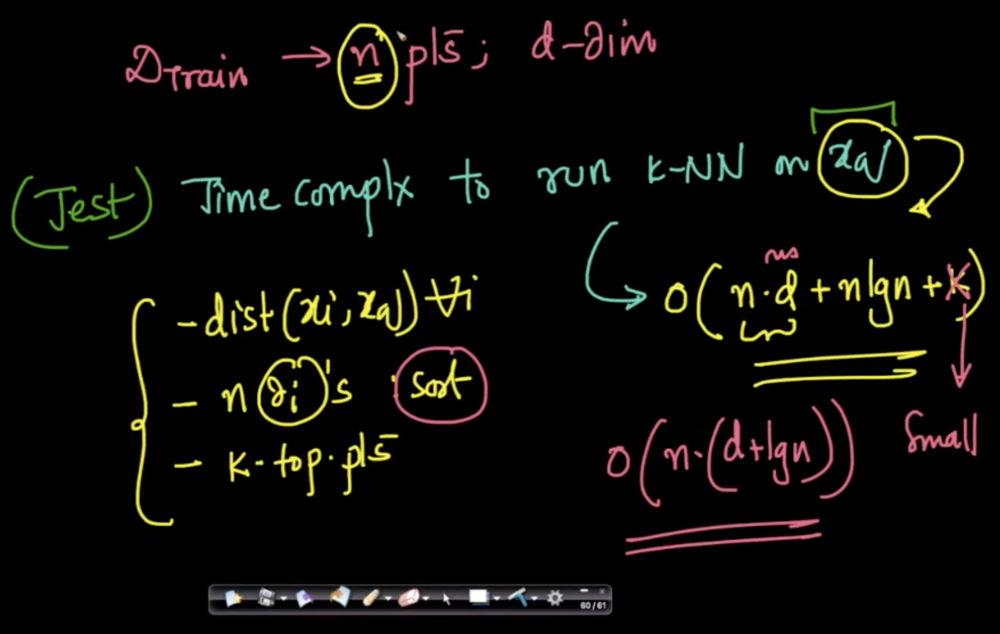

# **Bias-Variance Trade Off in KNN**


If we remember that, No training is involved in KNN,
#### how do we control the bias-Variance trade-off ?
- The only hyper-parameter tuning possible with KNN is K parameter.

## **Lets assume $K=1$, and we have two test data**
1. One close to the +ve noise/outlier
2. Other close to the -ve noise/Outlier

#### What will be the class label for both the test data ?
- Clearly, it will be same as the class label of the outlier



This means, when the value of K is too low, KNN is fiting to the noise or getting impacted by the noise/ outliers, hence our KNN model is Overfitting


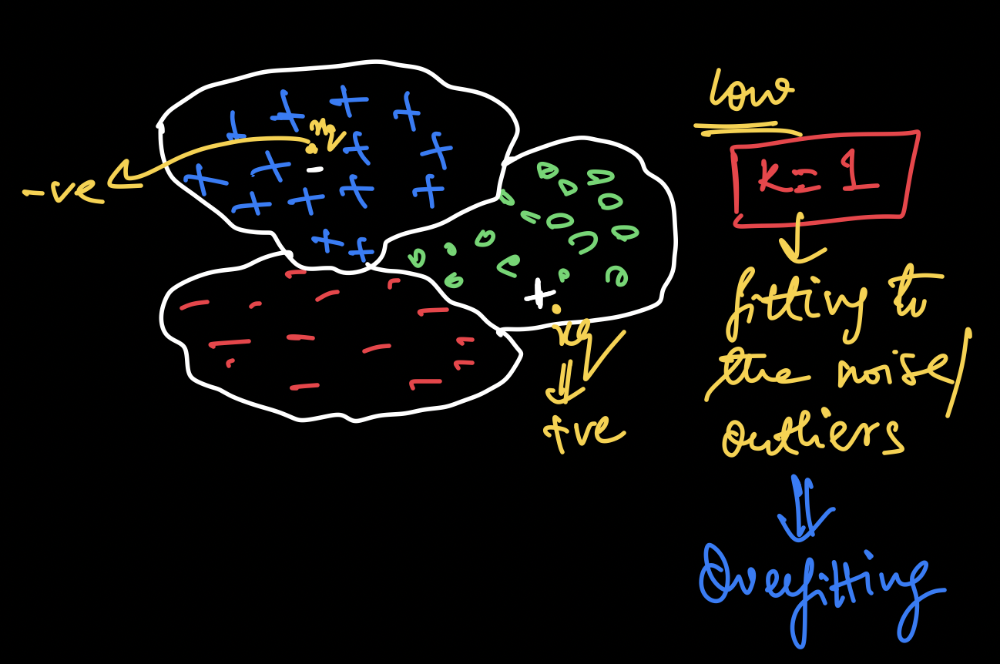


## **Now Lets consider K as a very large value, $K=131$, and training data**
- has 61 datapoints as +ve label ,  40 datapoints as -ve label and 30 datapoints as class 'o' label

#### What will be the class label for any test datapoint ?
Ans: No matter where the test datapoint is, the KNN model will always be predict
- the test datapoint as +ve class label.


This means, when the value of K is too high, KNN is Underfitting-


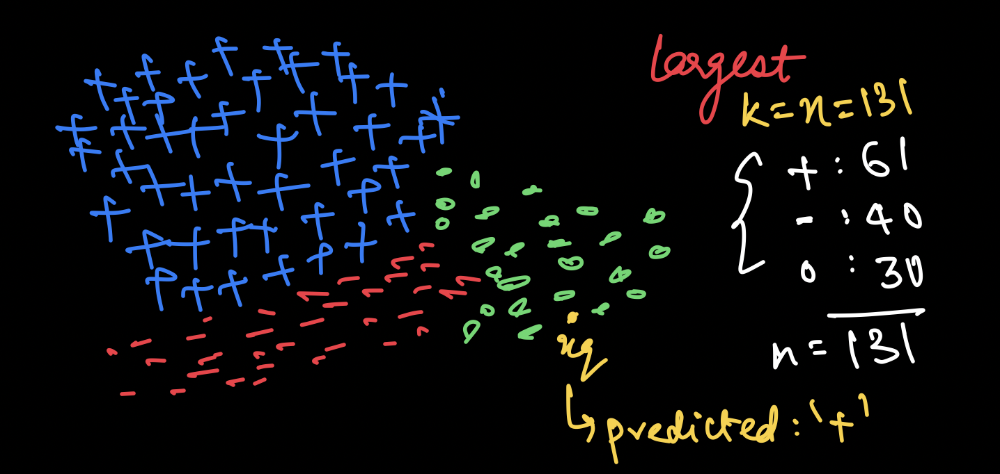

Now if plot error or any loss metrics and changing K Hyperparameter,
- We see how error is very high when KNN is overfitting and underfitting

- Hence, we pick that K ($K_{best}$) where errors is minimum


NOTE: we do all of this hyperparameter on our Validation data.



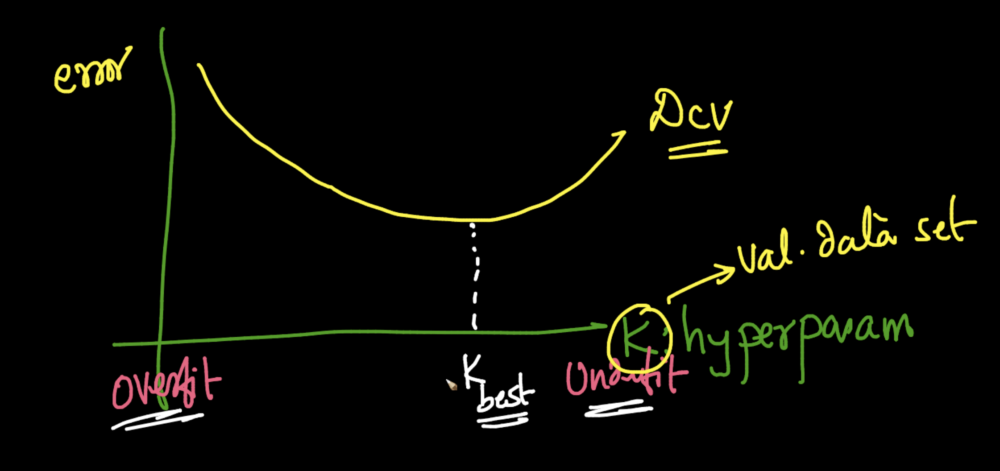

# **Outliers**
Lets consider some data points which have 3 outliers,
- Out of which two are -ve class labels and one is +ve class label

Do outliers impact the kNN model if we take K = 3?
- for the two -ve class outliers, the $x_q$ will get impacted and have a -ve class label , instead of +ve class label

- While for the +ve class outlier, the $x_q$ is predicted correctly

What if we reduce K to K=1 will outliers effect KNN?
- Both the outliers effect the KNN

What if we increase K to K=7 will outliers effect KNN?
- No, the outliers wont have any impact since the neighborhood will have majority of correct labels






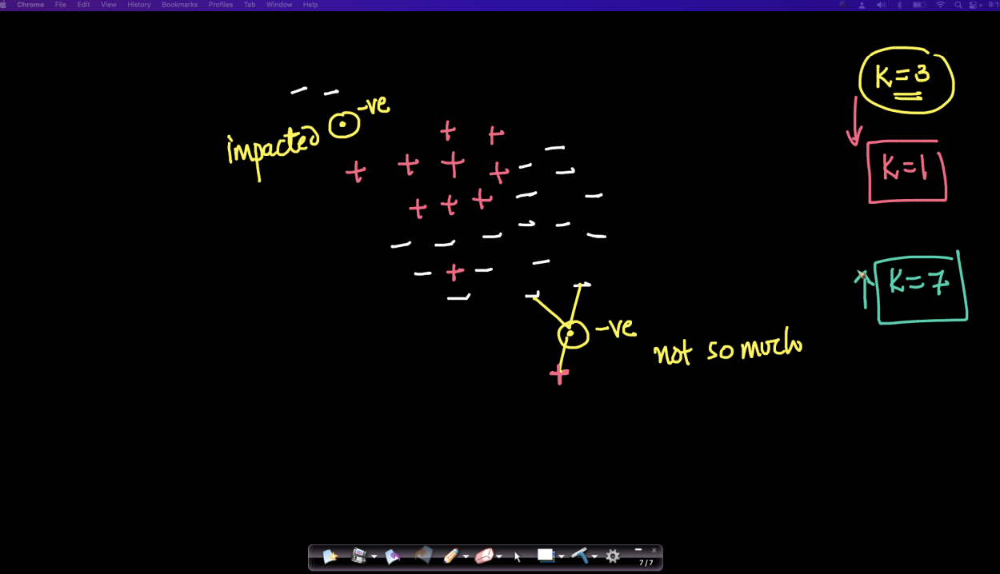

- As the value of the 'K' increases, impact of outliers decreases.

Note:  Even the $k_{best}$ from hyperparameter tuning, can be impacted by the outliers if the value is small.

#### Question: What if $x_q$ is an outlier, will KNN model be impacted ?
Ans- Rubbish, No model is expected to perform well on outlier






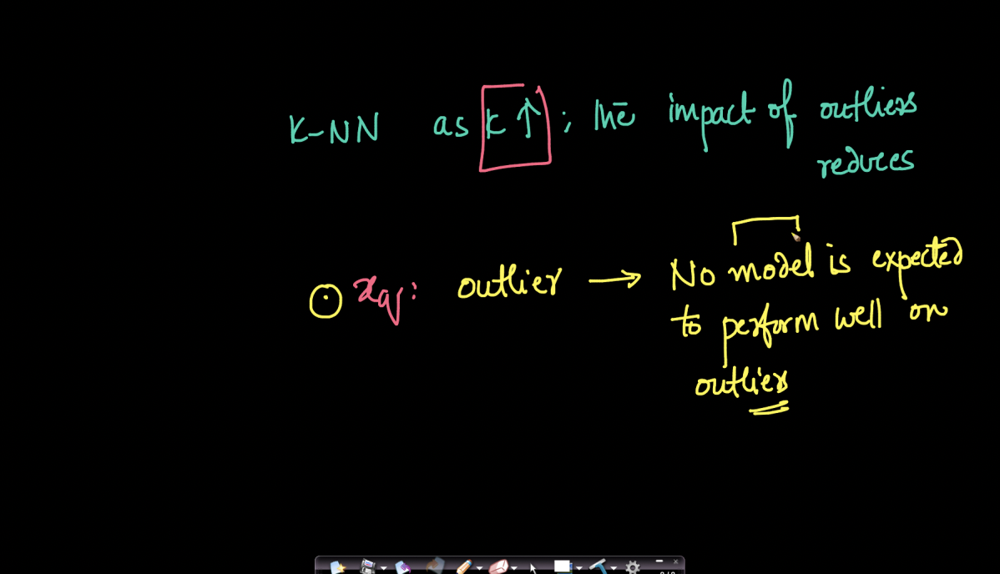

#### **How do we determine, whether $x_q$ is outlier or not ?**
- Lets assume we take a reasonable K = 5
- we then calculate Avg distance (D1) of $x_q$ to its 5 nearest neighbors

- we then calculate Avg distance of each $x_i$ in our data to its 5 nearest neighbors and take the average of the entire $x_i$ Avg (D2).
- this D2 tells how the avg distance should be for our entire data


#### if these two distances D1 and D2 differ alot, what can we say ?
- $x_q$ is an outlier


#### **Question: if original data has outliers, will it not affect avg of distance of $x_i$ ?**
- yes it will, so we can use median distance of $x_i$ instead.



We just created a simpler Outlier detection using KNN
- This will be a slow and time consuming Outlier detection algorithm





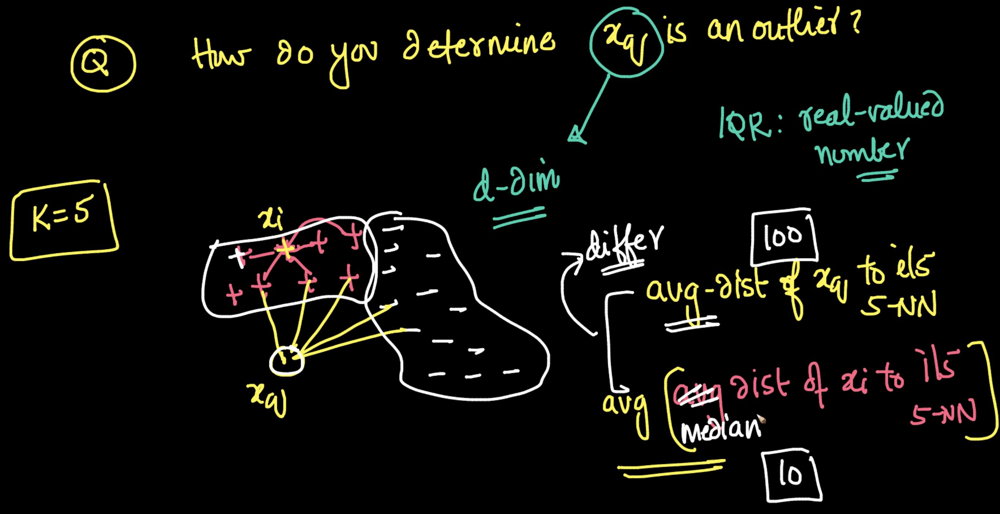

# **Interpretation of kNN Model**



Now lets talk about the intepretation of KNN model with an example:
- Suppose the KNN model helps predict whether a patient is diabetic or not ( $y_q = 1$ or $y_q = 0$ )
- By having some d-dimensional features $x_q$

#### how to make a doctor (non DS expert) understand the working of KNN ?


- Recap: For logistic and Linear Regression model we have the weights of the model  $w_{j}$ to make the model intepretable

- Coming back to our KNN model, lets understand it more with a geometric intuition

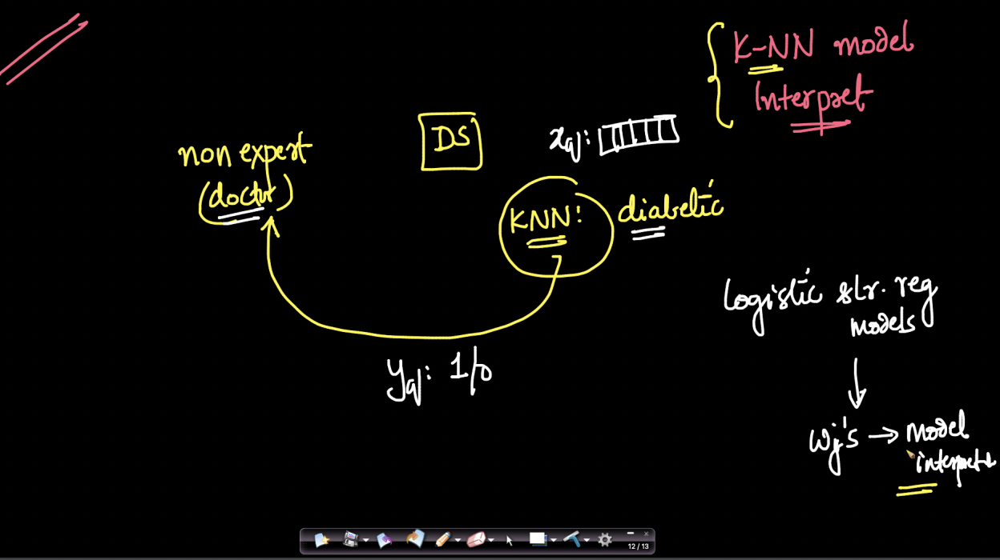

- Lets take K = 5 for our KNN and we want to predict diabetic or not for $x_q$
- from surrounding neighbors we can say the predicted class label will be +ve

- Since the datapoints which are close to $x_q$ are selected as nearest neighbors,
    - This means those selected nearest neighbors will have features same as the d-dimensional features $x_q$
    - Now we see, out of the 5 neighbors, 4 of them were +ve labelled or had diabetes

- Hence we can say, $x_q$ can be diabetic

Therefore in KNN, interpretability comes from neighborhood.  

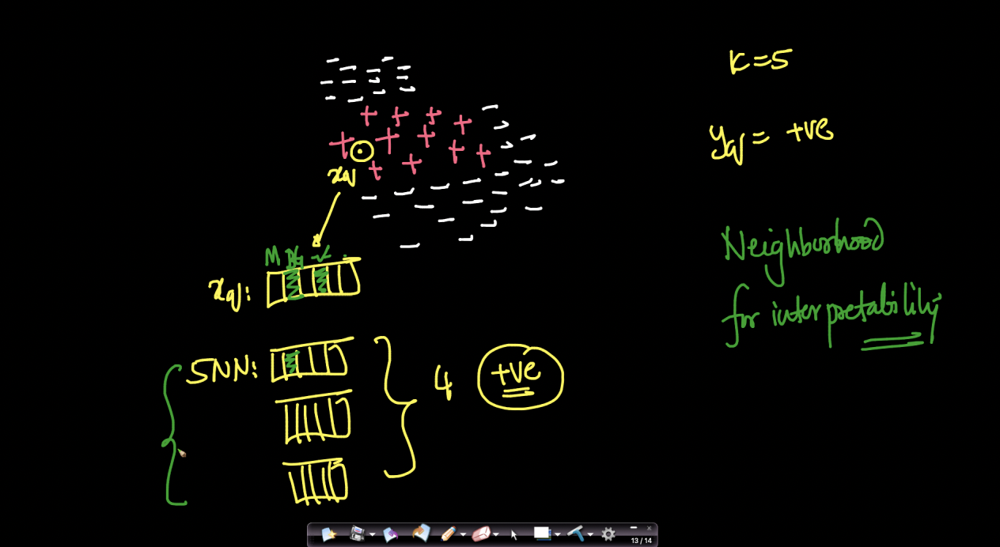

## **What if most features in $x_q$ are categorical, how will be calculating distance ?**
- Suppose $x_q$ has categorical features such as Gender, Race, Blood Group,...

- Now if we use Euclidean distance as our distance metrics,
    - Convert Categorical to Numerical
        - Using One-Hot Encoding
        - Target Encoding, where we replace Categorical values with Probability values
            - E.g if we have Male/Female/ Others as categorical features
            - We select all those samples where our Target variable = 1 given Gender=Male and find the Probability $P(y=1|x=Male)$ and replace Male with that probability            


#### But using One-Hot Encoding can lead to some issues
- One-Hot Encoding causes Dimensionality to increases
- it can lead to  Curse of Dimensionality, where Euclidean Distance fails

- We will use Cosine Similarity when dealing with one-hot encoding, though <font color='red'>we will cover in upcoming lectures.<font>,

here is an abstract of what Cosine Similarity is all about:

- Cosine similarity measures the similarity between two vectors of an inner product space.

- measured by the cosine of the angle between two vectors and determines whether two vectors are pointing in roughly the same direction

The formula for cosine similarity is:-
- $cos(θ) = \frac{A.B}{||A||.||B||}$

- $cos(θ) = \frac{∑_{i=1}^{n} A_i.B_i}{\sqrt {∑_{i=1}^{n} A_i^2} . \sqrt{∑_{i=1}^{n} B_i^2}}$




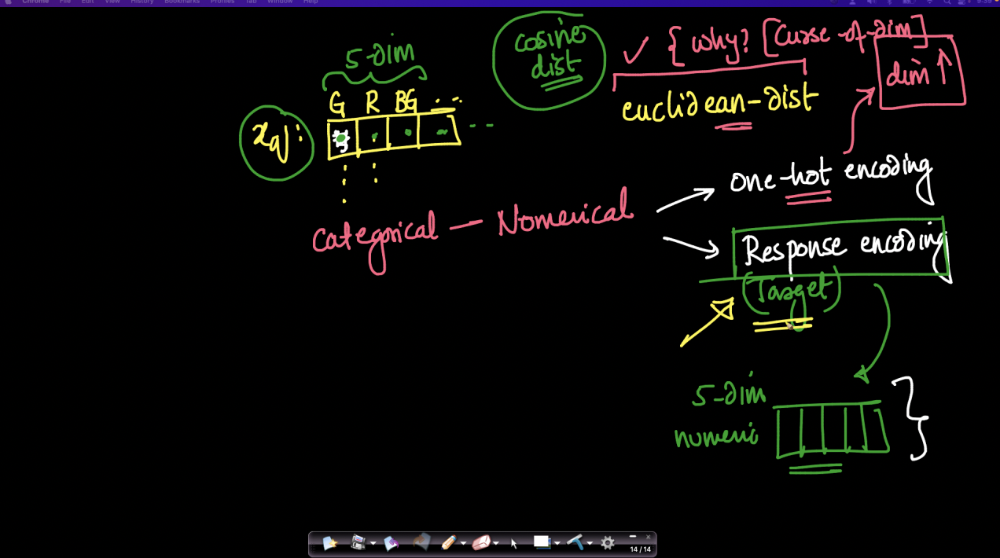

## **What are the different Distance metrics and when to use which ?**
The 2 most commonly used distance metrics are Cosine and Euclidean,

- We use Cosine Similarity when High-dimensions are present (We will cover this in later lectures)
- For low-dimensions we use Euclidean Distance
- Manhattan is not used widely in ML but is used in Maps

NOTE: Dimensions are not the only criteria to check which distance metrics to use

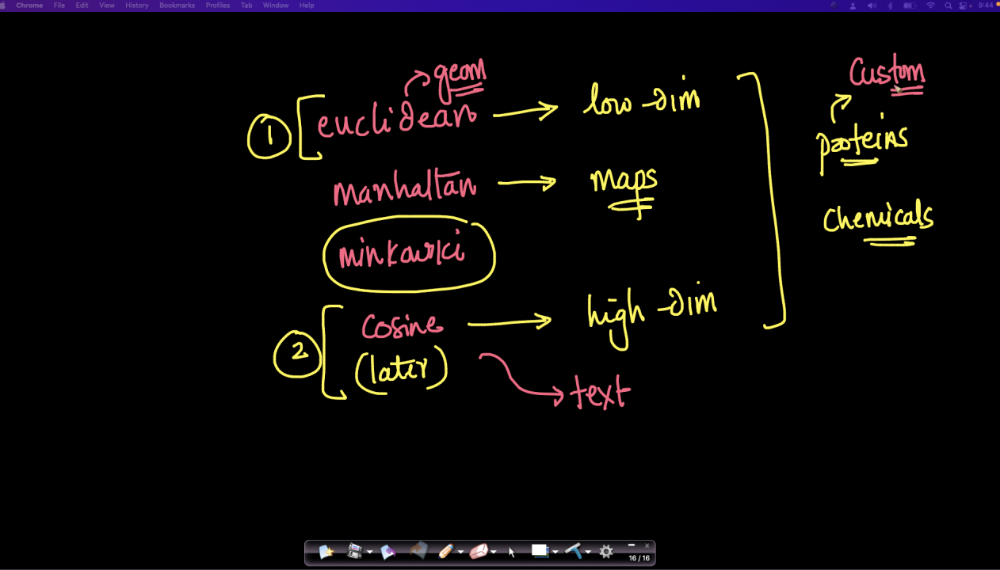

Recall in logistic Regression, how we used
- Sigmoid function to have our $ŷ$ be between 0 to 1 which became our probablistic for our class label
- as $ŷ$ will be the probability of y=1 given $x_q$


### **Question: Can we have a probalistic class label for KNN ?**



Now for KNN lets assume we have some datapoints with K = 7
- And for $x_q$ we have 5 -ve class labels and 2 +ve class labels

- First simple way of finding the probabilistic class labels will be to take ratio of counts of class label to the total number of nearest neighbors
    - Count of +ve class Label/ count of total number of Nearest Neighbor = $\frac{2}{7}$

- We can take the weighted distance $(w_i) = \frac{1}{distance}$ (as discussed in Weighted KNN),
- and define our probalistic as the ratio of sum of $w_i$ of the +ve class labels of nearest Neighbors to the sum of $w_i$ of all the nearest Neighbors.
    - $(w_i) = \frac{∑_{+ve}w_i}{∑ _{all}w_i}$


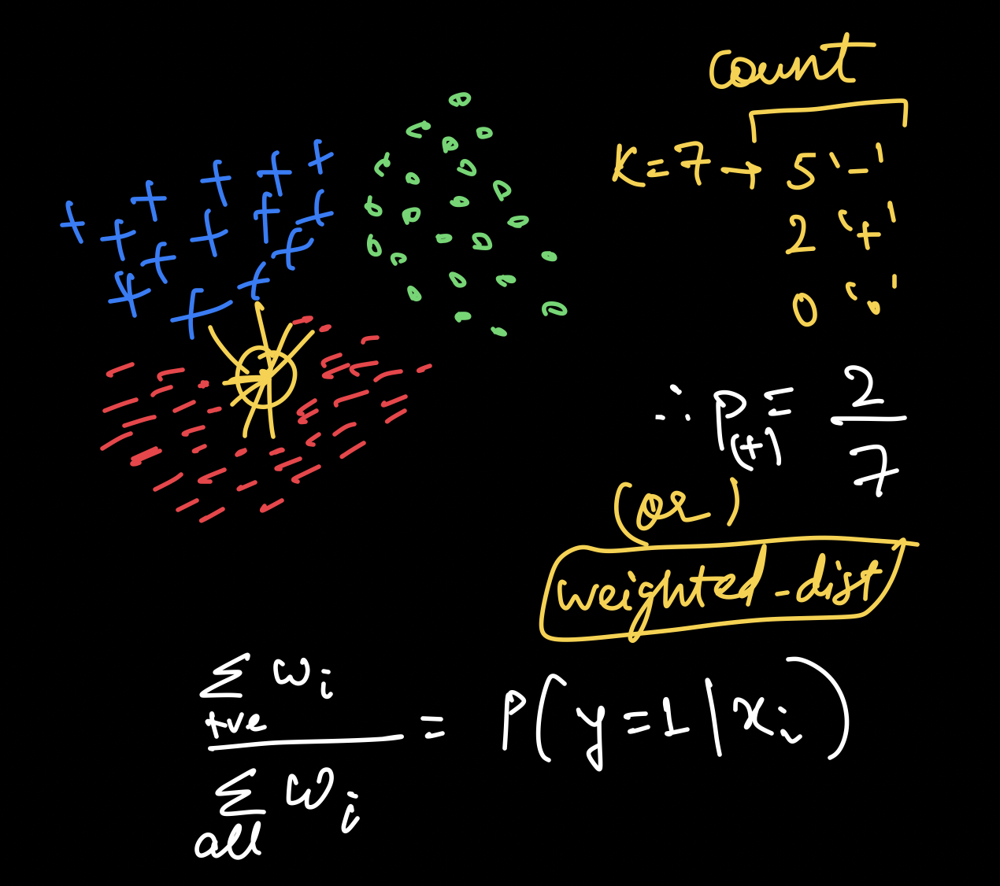

# **Google Image Search**

- We have seen how KNN test time complexity is too damn high, so why even teach it

Lets now look into Google Image search, which  a Real world Appication for KNN:
- So imagine we have an image which we pass through Deep Learning Algorithms <font color='red'> which we will cover in later lectures<font>


- Deep Learning converts the image into a d-dimensional vector

- in this d-dimensional space, if there are two similiar images $I_1$ and $I_2$, they tend to be very close to each other.





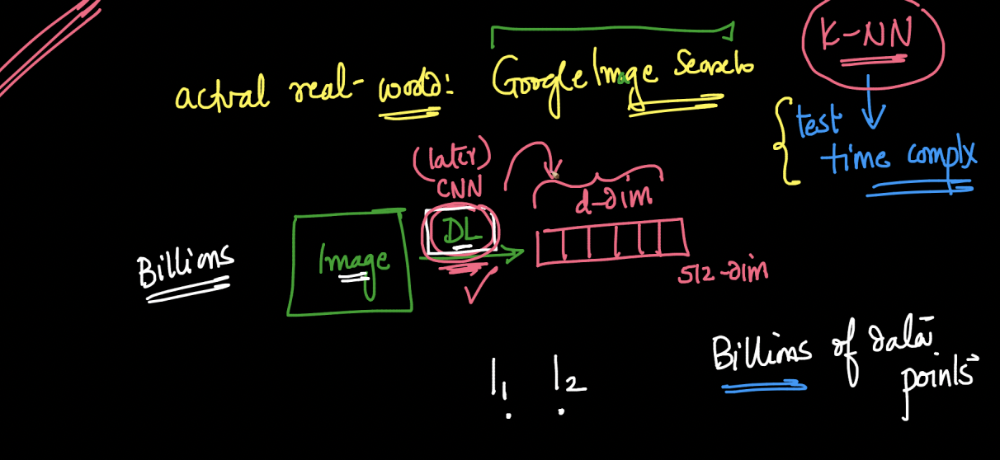

Lets suppose if we Google search Hyderbad
- The most common image we get is Char minar $I_1$
- The 2nd most common image we get is Buddha Statue $I_2$
- Then Google Engine searches for similar images of both $I_1$ and $I_2$ using Nearest Neighbors from billion images.

- A few other examples where Nearest neighbors are checked for similar things and recommend it to user are Pinterest and TikTok

This shows how KNN is widely in use algorithm

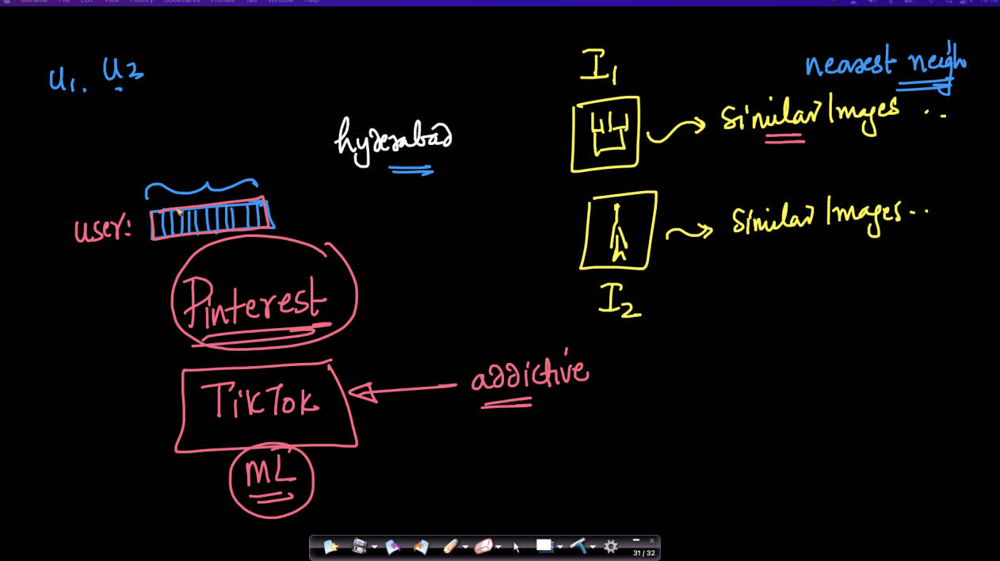

# **KNN based Imputation**

Lets say we have a d-dimensionsal features with n samples.
- Now for the $x_i$ feature,
    - the $j^{th}$ dimension is missing  


We have seen in EDA, hown imputation is used to fill the missing values


#### **Can we use KNN for Imputating missing data ?**
1. to find the value of $x_{ij}$, we find the K Nearest neighbors  for the $x_{i}$ but excluding all the dimensions which have missing value.
    - Hence we remove the jth dimension and compute the nearest neighbors

2. Supposedly, after performing KNN(with K = 5) we get $x_{10}, x_{12}, x_{14}, x_{31}, x_{42}$ as nearest neighbors
    - we then take the average of the $j^{th}$  values of each of the nearest neighbors and use it to impute the missing value for $x_i$




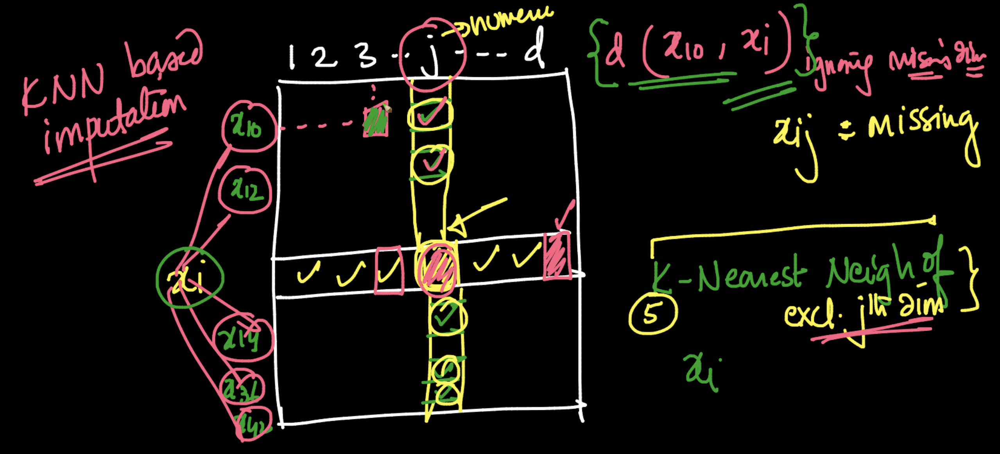

Lets implement KNNImputator
- By creating a Dummy data having two nan  

In [ ]:
!gdown 1vDIXh1yJxLpmgdh3gZGM6WX0u3GCPuIS
#https://drive.google.com/file/d/1vDIXh1yJxLpmgdh3gZGM6WX0u3GCPuIS/view?usp=sharing

Downloading...
From: https://drive.google.com/uc?id=1vDIXh1yJxLpmgdh3gZGM6WX0u3GCPuIS
To: /content/knn_imputation.csv
100% 12.9k/12.9k [00:00<00:00, 16.5MB/s]


In [ ]:
df_imp=pd.read_csv('knn_imputation.csv')

In [ ]:
df_imp.head()

,Unnamed: 0,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,0.000000,1.0,0.112821,0.129791,0.081464,0.003106,0.065427,0.027847
1,0.003759,1.0,0.062774,0.131890,0.103097,0.028548,0.080590,0.036984
2,0.007519,1.0,0.056495,0.118232,NaN,0.039116,0.086052,0.163559
3,0.011278,1.0,0.118136,0.014476,0.045464,0.104842,0.012346,0.037234
4,0.015038,1.0,0.201520,0.071915,0.077552,0.063934,0.043455,0.108093


In [ ]:
df_imp.drop(['Unnamed: 0'],axis=1,inplace=True)
df_imp.isna().sum()

Region               8
Fresh               13
Milk                15
Grocery              9
Frozen               8
Detergents_Paper    10
Delicassen          11
dtype: int64

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler


KNN Imptuer is a distance-based imputation method and it requires us to normalize our data. Otherwise, the different scales of our data will lead the KNN Imputer to generate biased replacements for the missing values. For simplicity, we will use Scikit-Learn’s MinMaxScaler which will scale our variables to have values between 0 and 1.

In [ ]:
scaler = MinMaxScaler()
df_imp = pd.DataFrame(scaler.fit_transform(df_imp), columns = df_imp.columns)
df_imp.head()

,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,1.0,0.112821,0.129791,0.081464,0.003106,0.065427,0.027847
1,1.0,0.062774,0.131890,0.103097,0.028548,0.080590,0.036984
2,1.0,0.056495,0.118232,NaN,0.039116,0.086052,0.163559
3,1.0,0.118136,0.014476,0.045464,0.104842,0.012346,0.037234
4,1.0,0.201520,0.071915,0.077552,0.063934,0.043455,0.108093


In [ ]:
imputer = KNNImputer(n_neighbors=5)
df_imp = pd.DataFrame(imputer.fit_transform(df_imp),columns = df_imp.columns)

In [ ]:
df_imp.head()

,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,1.0,0.112821,0.129791,0.081464,0.003106,0.065427,0.027847
1,1.0,0.062774,0.131890,0.103097,0.028548,0.080590,0.036984
2,1.0,0.056495,0.118232,0.114492,0.039116,0.086052,0.163559
3,1.0,0.118136,0.014476,0.045464,0.104842,0.012346,0.037234
4,1.0,0.201520,0.071915,0.077552,0.063934,0.043455,0.108093


**Observe**
The NaN in the sample = 2 , column = Grocery is now imputed with value = 0.114492

In [ ]:
df_imp.isna().sum()


Region              0
Fresh               0
Milk                0
Grocery             0
Frozen              0
Detergents_Paper    0
Delicassen          0
dtype: int64